In [4]:
!pip install datasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.6/474.6 kB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 72.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 29.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 32.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 20.9 MB/s eta 0:00:00


In [5]:
!pip install -q git+https://github.com/huggingface/transformers.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 66.5 MB/s eta 0:00:00


In [6]:
!pip install transformers[torch]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/219.1 kB 21.0 MB/s eta 0:00:00


In [7]:
!pip install --upgrade accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [8]:
!pip install --upgrade transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [9]:
!pip install accelerate -U

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [10]:
!pip show transformers
!pip show accelerate

Name: transformers
Version: 4.30.0.dev0
Summary: State-of-the-art Machine Learning for JAX, PyTorch and TensorFlow
Home-page: https://github.com/huggingface/transformers
Author: The Hugging Face team (past and future) with the help of all our contributors (https://github.com/huggingface/transformers/graphs/contributors)
Author-email: transformers@huggingface.co
License: Apache 2.0 License
Location: /usr/local/lib/python3.10/dist-packages
Requires: filelock, huggingface-hub, numpy, packaging, pyyaml, regex, requests, safetensors, tokenizers, tqdm
Required-by: 
Name: accelerate
Version: 0.19.0
Summary: Accelerate
Home-page: https://github.com/huggingface/accelerate
Author: The HuggingFace team
Author-email: sylvain@huggingface.co
License: Apache
Location: /usr/local/lib/python3.10/dist-packages
Requires: numpy, packaging, psutil, pyyaml, torch
Required-by: 


In [11]:
import os
from copy import deepcopy
from dataclasses import dataclass
from typing import Dict, List, Optional, Tuple
from datasets import load_dataset, set_caching_enabled
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
from transformers import (
    # Preprocessing / Common
    AutoTokenizer, AutoFeatureExtractor,
    # Text & Image Models (Now, image transformers like ViTModel, DeiTModel, BEiT can also be loaded using AutoModel)
    AutoModel,            
    # Training / Evaluation
    TrainingArguments, Trainer,
    # Misc
    logging
)

import nltk
nltk.download('wordnet')
from nltk.corpus import wordnet

from sklearn.metrics import accuracy_score, f1_score
## Standard libraries
import os
import numpy as np 
import random
from PIL import Image
from types import SimpleNamespace

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline 
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.reset_orig()

## PyTorch
import torch
import torch.nn as nn
import torch.utils.data as data
import torch.optim as optim
# Torchvision
import torchvision
from torchvision.datasets import CIFAR10
from torchvision import transforms

[nltk_data] Downloading package wordnet to /root/nltk_data...
<ipython-input-11-fe81bac6a6bf>:37: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf') # For export


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.chdir('/content/drive/MyDrive/MLDM2_project')

In [ ]:
# from datasets import load_dataset
# dataset = load_dataset("HuggingFaceM4/VQAv2")

In [ ]:
# dataset.save_to_disk("VQA2_dataset")

In [12]:
from datasets import load_from_disk

# Load the train from disk
train = load_from_disk("VQA2_dataset/train")

In [13]:
validation=load_from_disk("VQA2_dataset/validation")

In [14]:
#Read only the Answer space from this model (labels and the config file)
from transformers import ViltConfig
config = ViltConfig.from_pretrained("dandelin/vilt-b32-finetuned-vqa")

In [15]:
print(config.id2label)

{0: 'net', 1: 'pitcher', 2: 'orange', 3: 'yes', 4: 'white', 5: 'skiing', 6: 'red', 7: 'frisbee', 8: 'brushing teeth', 9: 'no', 10: 'black and white', 11: 'skateboard', 12: '1', 13: 'blue', 14: 'green', 15: 'motorcycle', 16: 'gray', 17: '2', 18: 'purse', 19: 'skis', 20: 'poles', 21: 'surfboard', 22: 'dog', 23: 'on', 24: 'office', 25: 'large', 26: 'very big', 27: 'laptop', 28: 'vent', 29: 'computer', 30: 'black', 31: 'bear', 32: '3', 33: 'wii', 34: 'glasses', 35: 'tree', 36: 'eating', 37: 'log', 38: '5', 39: 'raft', 40: 'left', 41: 'living room', 42: 'pink', 43: 'right', 44: 'railing', 45: 'grass', 46: 'wire', 47: '10 years', 48: 'knife', 49: 'cake', 50: 'banana', 51: 'chef', 52: 'vanilla', 53: '4', 54: 'outdoor', 55: 'mustard', 56: 'bun', 57: 'clouds', 58: 'dock', 59: 'brown', 60: 'silver', 61: 'refrigerator', 62: 'square', 63: 'teddy', 64: 'elm', 65: 'stripes', 66: 'baseball', 67: 'catcher', 68: 'beer', 69: 'bottom', 70: 'north', 71: 'nike', 72: 'yellow and white', 73: 'morning', 74: '

In [16]:
from tqdm.notebook import tqdm

def get_score(count: int) -> float:
    return min(1.0, count / 3)

def add_labels_scores(annotation):
    answers = annotation['answers']
    answer_count = {}
    for answer in answers:
        answer_ = answer["answer"]
        answer_count[answer_] = answer_count.get(answer_, 0) + 1
    labels = []
    scores = []
    for answer in answer_count:
        #print(list(config.label2id.keys()))
        if answer not in list(config.label2id.keys()):
            continue
        labels.append(config.label2id[answer])
        score = get_score(answer_count[answer])
        scores.append(score)
    annotation['labels'] = labels
    annotation['scores'] = scores
    return annotation

In [17]:
len(train)

443757

In [18]:
len(validation)

214354

In [19]:
from PIL import Image
import numpy as np
from IPython.display import display


#This is not the subsetting, so we take the whole train, the subsetting happens way below
num_samples_to_display = len(train)
subset_train = train.select(range(num_samples_to_display))


In [20]:
from PIL import Image
import numpy as np
from IPython.display import display

#This is not the subsetting, so we take the whole validation, the subsetting happens way below
num_samples_to_display = len(validation)
subset_val = validation.select(range(num_samples_to_display))

In [21]:
def showImage(istrain=True, id=None):
    if istrain:
        data = subset_train
    else:
        data = subset_val
    if id == None:
        id = np.random.randint(len(data))
    
    modified_item = add_labels_scores(data[id])
    #print(f"Sample {id}: {modified_item}\n")
    image = modified_item['image']

    print(image)
    display(image)

    print("Question:\t", modified_item["question"])
    print("Answer:\t", modified_item["answers"])
    print("Labels:\t", modified_item["labels"])
    print("Scores:\t", modified_item["scores"])
    print("Scores for these labels:\t",[config.id2label[label] for label in modified_item["labels"]])


<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=425x640 at 0x7FBC74538B50>


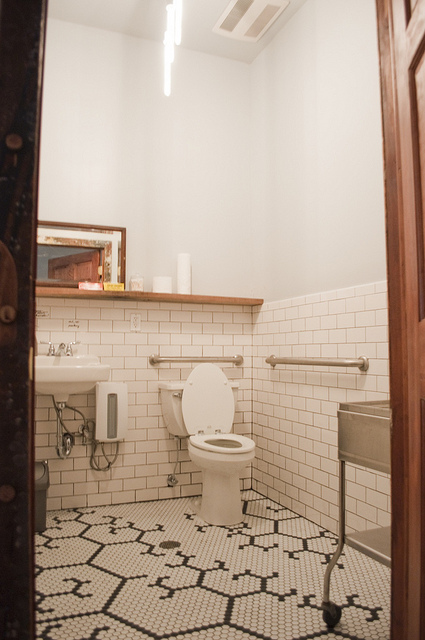

Question:	 What color is the trash can?
Answer:	 [{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'gray', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'gray', 'answer_confidence': 'yes', 'answer_id': 3}, {'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'gray', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'gray', 'answer_confidence': 'yes', 'answer_id': 7}, {'answer': 'black', 'answer_confidence': 'maybe', 'answer_id': 8}, {'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 10}]
Labels:	 [30, 16]
Scores:	 [1.0, 1.0]
Scores for these labels:	 ['black', 'gray']


In [22]:
showImage(True)

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x480 at 0x7FB23D04B160>


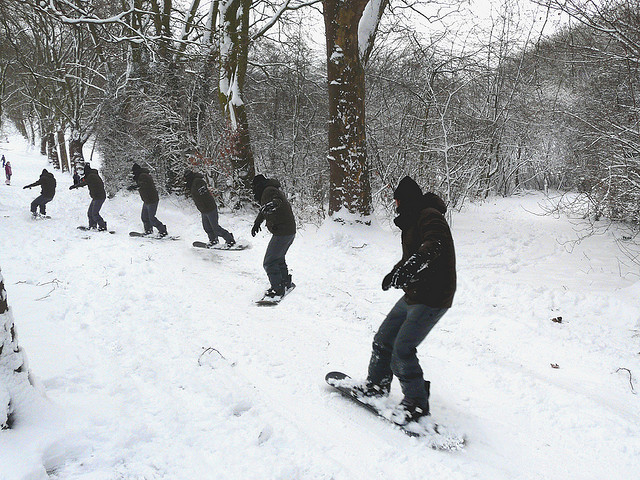

Question:	 Does this appear to be a photo of multiple exposures of the black clad snowboarder?
Answer:	 [{'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'yes', 'answer_confidence': 'maybe', 'answer_id': 3}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 7}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 8}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 10}]
Labels:	 [3]
Scores:	 [1.0]
Scores for these labels:	 ['yes']


In [23]:
showImage(False)

In [24]:
import torch
from PIL import Image

class VQADataset(torch.utils.data.Dataset):
    """VQA (v2) dataset."""

    def __init__(self, questions, annotations, preprocessor,tokenizer):
        self.questions = questions
        self.annotations = annotations
        self.preprocessor = preprocessor
        self.tokenizer=tokenizer

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        # get image + text
        annotations = self.annotations[idx]
        questions = self.questions[idx]
        image = annotations['image']
        image = image.convert("RGB")  # Explicitly convert the PIL Image object to RGB mode        
        image = np.array(image)
        text = questions['question']
        
        encoding = self.preprocessor(image, return_tensors="pt")
        encoded_text = self.tokenizer(
            text=text,
            padding='max_length',
            max_length=24,
            truncation=True,
            return_tensors='pt',
            return_token_type_ids=True,
            return_attention_mask=True,
        )

        encoding ["input_ids"]= encoded_text['input_ids']
        encoding ["token_type_ids"]= encoded_text['token_type_ids']
        encoding ["attention_mask"]= encoded_text['attention_mask']


        # remove batch dimension
        for k,v in encoding.items():
          encoding[k] = v.squeeze()
        # add labels
        labels = annotations['labels']
        scores = annotations['scores']
        # based on: https://github.com/dandelin/ViLT/blob/762fd3975c180db6fc88f577cf39549983fa373a/vilt/modules/objectives.py#L301
        targets = torch.zeros(len(config.id2label))
        for label, score in zip(labels, scores):
              targets[label] = score
        encoding["labels"] = targets

        return encoding


## Subsetting

In [25]:
import random

# Specify the number of samples you want to use
num_samples = 5000

# Randomly sample indices for our subset
indices = random.sample(range(len(subset_train)), num_samples)

# Create subset from the sampled indices
subset_questions = [{'question': subset_train[i]['question']} for i in indices]
subset_annotations = [add_labels_scores(subset_train[i]) for i in indices]

In [26]:
from sklearn.model_selection import train_test_split
# Specify the number of samples you want to use
num_samples = 1000

# Generate a random subset of indices
all_indices = list(range(len(subset_val)))
random_indices = random.sample(all_indices, num_samples)

# Use sklearn's train_test_split function to split the indices
val_indices, test_indices = train_test_split(random_indices, test_size=0.30, random_state=42)


In [27]:
subset_val_questions = [{'question': subset_val[i]['question']} for i in val_indices]
subset_val_annotations = [add_labels_scores(subset_val[i]) for i in val_indices]

In [28]:
subset_test_questions = [{'question': subset_val[i]['question']} for i in test_indices]
subset_test_annotations = [add_labels_scores(subset_val[i]) for i in test_indices]

In [29]:
print(subset_questions[0])
print(subset_annotations[0])

{'question': 'What is the sign attached to?'}
{'question_type': 'what is the', 'multiple_choice_answer': 'pole', 'answers': [{'answer': 'pole', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'roof', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'pole', 'answer_confidence': 'yes', 'answer_id': 3}, {'answer': 'pole', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'building', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'pole', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'restaurant', 'answer_confidence': 'maybe', 'answer_id': 7}, {'answer': 'mystic blue sign', 'answer_confidence': 'yes', 'answer_id': 8}, {'answer': 'roof', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'pole', 'answer_confidence': 'yes', 'answer_id': 10}], 'image_id': 262623, 'answer_type': 'other', 'question_id': 262623003, 'question': 'What is the sign attached to?', 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x480 at 0x7FA313A22FB0>, 'l

In [30]:
print(subset_val_questions[0])
print(subset_val_annotations[0])

{'question': 'Is the woman wearing a backpack or shoulder bag?'}
{'question_type': 'is the woman', 'multiple_choice_answer': 'shoulder bag', 'answers': [{'answer': 'shoulder bag', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'shoulder bag', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'shoulder bag', 'answer_confidence': 'yes', 'answer_id': 3}, {'answer': 'shoulder bag', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'shoulder bag', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'shoulder bag', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'shoulder bag', 'answer_confidence': 'yes', 'answer_id': 7}, {'answer': 'shoulder bag', 'answer_confidence': 'yes', 'answer_id': 8}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'shoulder bag', 'answer_confidence': 'yes', 'answer_id': 10}], 'image_id': 131919, 'answer_type': 'other', 'question_id': 131919000, 'question': 'Is the woman wearing a backpack or shoulder bag?', 

In [31]:
print(subset_test_questions[0])
print(subset_test_annotations[0])

{'question': 'Is that an airplane in the image?'}
{'question_type': 'is', 'multiple_choice_answer': 'yes', 'answers': [{'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 3}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 7}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 8}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 10}], 'image_id': 472, 'answer_type': 'yes/no', 'question_id': 472000, 'question': 'Is that an airplane in the image?', 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x226 at 0x7FA309B815A0>, 'labels': [3], 'scores': [1.0]}


In [32]:
text='bert-base-uncased'
image='google/vit-base-patch16-384'
tokenizer = AutoTokenizer.from_pretrained(text)
preprocessor=AutoFeatureExtractor.from_pretrained(image)

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


In [33]:
vqa2_dataset = VQADataset(questions=subset_questions,
                     annotations=subset_annotations,
                     preprocessor=preprocessor,
                     tokenizer=tokenizer)

In [34]:
vqa2_dataset_val = VQADataset(questions=subset_val_questions,
                     annotations=subset_val_annotations,
                     preprocessor=preprocessor,
                     tokenizer=tokenizer)

In [35]:
vqa2_dataset_test = VQADataset(questions=subset_test_questions,
                     annotations=subset_test_annotations,
                     preprocessor=preprocessor,
                     tokenizer=tokenizer)

In [36]:
vqa2_dataset[0].keys()

dict_keys(['pixel_values', 'input_ids', 'token_type_ids', 'attention_mask', 'labels'])

In [37]:
vqa2_dataset_val[0].keys()

dict_keys(['pixel_values', 'input_ids', 'token_type_ids', 'attention_mask', 'labels'])

In [38]:
vqa2_dataset_test[0].keys()

dict_keys(['pixel_values', 'input_ids', 'token_type_ids', 'attention_mask', 'labels'])

In [39]:
from torch.utils.data import DataLoader

def collate_fn(batch):
  input_ids = [item['input_ids'] for item in batch]
  #[print(len(item)) for item in input_ids]
  pixel_values = [item['pixel_values'] for item in batch]
  attention_mask = [item['attention_mask'] for item in batch]
  token_type_ids = [item['token_type_ids'] for item in batch]
  labels = [item['labels'] for item in batch]
  
  # # create padded pixel values and corresponding pixel mask
  # encoding = processor.feature_extractor.pad_and_create_pixel_mask(pixel_values, return_tensors="pt")
  
  # create new batch
  batch = {}
  batch['pixel_values'] = torch.stack(pixel_values)
  batch['input_ids'] = torch.stack(input_ids)
  batch['token_type_ids'] = torch.stack(token_type_ids)
  batch['attention_mask'] = torch.stack(attention_mask)
  # batch['pixel_mask'] = encoding['pixel_mask']
  batch['labels'] = torch.stack(labels)
  
  return batch

train_dataloader = DataLoader(vqa2_dataset, collate_fn=collate_fn, batch_size=4, shuffle=True,num_workers=4)
val_dataloader = DataLoader(vqa2_dataset_val, collate_fn=collate_fn, batch_size=4,num_workers=4)

In [40]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
  print(k, v.shape)

pixel_values torch.Size([4, 3, 384, 384])
input_ids torch.Size([4, 24])
token_type_ids torch.Size([4, 24])
attention_mask torch.Size([4, 24])
labels torch.Size([4, 3129])


## Define the Model

In [41]:
class MultimodalVQAModel(nn.Module):
    def __init__(
            self,
            num_labels: int = len(config.id2label),
            intermediate_dim: int = 512,
            pretrained_text_name: str = 'bert-base-uncased',
            pretrained_image_name: str = 'google/vit-base-patch16-384'):
     
        super(MultimodalVQAModel, self).__init__()
        self.num_labels = num_labels
        self.pretrained_text_name = pretrained_text_name
        self.pretrained_image_name = pretrained_image_name
        
        self.text_encoder = AutoModel.from_pretrained(
            self.pretrained_text_name,
        )
        self.image_encoder = AutoModel.from_pretrained(
            self.pretrained_image_name,
        )
        self.fusion = nn.Sequential(
            nn.Linear(self.text_encoder.config.hidden_size + self.image_encoder.config.hidden_size, intermediate_dim),
            nn.ReLU(),
            nn.Dropout(0.5),
        )
        
        self.classifier = nn.Linear(intermediate_dim, self.num_labels)
        
        self.criterion = nn.CrossEntropyLoss()
    def forward(
            self,
            pixel_values: torch.FloatTensor,
            input_ids: torch.LongTensor,
            token_type_ids: Optional[torch.LongTensor] = None,
            attention_mask: Optional[torch.LongTensor] = None,
            labels: Optional[torch.LongTensor] = None):
        
        encoded_text = self.text_encoder(
            input_ids=input_ids,
            attention_mask=attention_mask,
            token_type_ids=token_type_ids,
            return_dict=True,
        )
        encoded_image = self.image_encoder(
            pixel_values=pixel_values,
            return_dict=True,
        )
        fused_output = self.fusion(
            torch.cat(
                [
                    encoded_text['pooler_output'],
                    encoded_image['pooler_output'],
                ],
                dim=1
            )
        )
        logits = self.classifier(fused_output)
        out = {
            "logits": logits
        }
        if labels is not None:
            loss = self.criterion(logits, labels)
            out["loss"] = loss
        return out

In [42]:
#  x = torch.randn(1, 3)
#  torch.cat([x, x, x], dim=1)

In [43]:
# Function for setting the seed
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
set_seed(42)

# Ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cpu") if not torch.cuda.is_available() else torch.device("cuda:0")
print("Using device", device)

Using device cuda:0


### Model Structure

In [44]:
model = MultimodalVQAModel()
model

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Some weights of the model checkpoint at google/vit-base-patch16-384 were not used when initializing ViTModel: ['classifier.bias', 'classifier.weight']
- This IS expected if you are initializing ViTModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing ViTModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-384 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


MultimodalVQAModel(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, el

### Forward Pass

In [45]:
example = vqa2_dataset[0]
print(example.keys())
# add batch dimension + move to GPU
example = {k: v.unsqueeze(0).to(device) for k,v in example.items()}
print(example)
# forward pass
model.to(device)
outputs = model(**example)

dict_keys(['pixel_values', 'input_ids', 'token_type_ids', 'attention_mask', 'labels'])
{'pixel_values': tensor([[[[-0.2627, -0.2627, -0.2627,  ..., -0.9765, -0.9765, -0.9765],
          [-0.2471, -0.2471, -0.2471,  ..., -0.9765, -0.9765, -0.9765],
          [-0.1922, -0.2000, -0.2000,  ..., -0.9765, -0.9765, -0.9765],
          ...,
          [-0.7176, -0.8039, -0.8118,  ...,  0.4353,  0.4275,  0.4118],
          [-0.6392, -0.6941, -0.7882,  ...,  0.4353,  0.4275,  0.4039],
          [-0.7098, -0.6392, -0.6627,  ...,  0.4431,  0.4353,  0.4196]],

         [[-0.2627, -0.2627, -0.2627,  ..., -0.9765, -0.9765, -0.9765],
          [-0.2471, -0.2471, -0.2471,  ..., -0.9765, -0.9765, -0.9765],
          [-0.1922, -0.2000, -0.2000,  ..., -0.9765, -0.9765, -0.9765],
          ...,
          [-0.7176, -0.8039, -0.8118,  ...,  0.4353,  0.4275,  0.4118],
          [-0.6392, -0.6941, -0.7882,  ...,  0.4353,  0.4275,  0.4039],
          [-0.7098, -0.6392, -0.6627,  ...,  0.4431,  0.4353,  0.4196]],

In [46]:
labels = np.random.randint(len(config.id2label), size=5)
preds = np.random.randint(len(config.id2label), size=5)

def showAnswers(ids):
    print([config.id2label[id] for id in ids])

showAnswers(labels)
showAnswers(preds)

['uniforms', 'soup', 'diamond', 'frosted', 'citizen']
['headband', 'soldiers', 'cirrus', 'human', 'poodle']


## Number of parameters of the model

In [47]:
def countTrainableParameters(model):
    num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print("No. of trainable parameters:\t{0:,}".format(num_params))


In [48]:
countTrainableParameters(model) # For BERT-ViT model

No. of trainable parameters:	198,555,449


### Using Lightning module for training

In [49]:
!pip install pytorch-lightning

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.0/719.0 kB 40.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 48.7 MB/s eta 0:00:00


In [50]:
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint

class LightningMultimodalVQAModel(pl.LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, pixel_values, input_ids, token_type_ids=None, attention_mask=None, labels=None):
        return self.model(pixel_values=pixel_values, input_ids=input_ids, token_type_ids=token_type_ids, attention_mask=attention_mask, labels=labels)

    def training_step(self, batch, batch_idx):
        output = self(**batch)
        loss = output["loss"]
        self.log('train_loss', loss)
        # Compute additional metrics
        preds = torch.argmax(output["logits"], dim=1).detach().cpu().numpy()
        labels = torch.argmax(batch["labels"], dim=1).detach().cpu().numpy()
        #labels = batch['labels'].detach().cpu().numpy()

        accuracy = accuracy_score(labels, preds)
        self.log('train_accuracy', accuracy, on_step=True, on_epoch=True, prog_bar=True)

        f1 = f1_score(labels, preds, average='weighted')
        self.log('train_f1', f1, on_step=True, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        output = self(**batch)
        loss = output["loss"]
        self.log('val_loss', loss)

        # Compute additional metrics
        preds = torch.argmax(output["logits"], dim=1).detach().cpu().numpy()
        labels = torch.argmax(batch["labels"], dim=1).detach().cpu().numpy()
        #labels = batch['labels'].detach().cpu().numpy()

        accuracy = accuracy_score(labels, preds)
        self.log('val_accuracy', accuracy, on_step=True, on_epoch=True, prog_bar=True)

        f1 = f1_score(labels, preds, average='weighted')
        self.log('val_f1', f1, on_step=True, on_epoch=True, prog_bar=True)


    def test_step(self, batch, batch_idx):
        output = self(**batch)
        loss = output["loss"]
        self.log('test_loss', loss)
        # Compute additional metrics
        preds = torch.argmax(output["logits"], dim=1).detach().cpu().numpy()
        labels = torch.argmax(batch["labels"], dim=1).detach().cpu().numpy()
        #labels = batch['labels'].detach().cpu().numpy()

        accuracy = accuracy_score(labels, preds)
        self.log('test_accuracy', accuracy, on_step=True, on_epoch=True, prog_bar=True)

        f1 = f1_score(labels, preds, average='weighted')
        self.log('test_f1', f1, on_step=True, on_epoch=True, prog_bar=True)


    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.model.parameters(), lr=5e-5)
        return optimizer






In [51]:
# Initialize your model
multimodal_model = model
lightning_model = LightningMultimodalVQAModel(multimodal_model)

# Define the checkpoint callback
checkpoint_callback = ModelCheckpoint(
    dirpath="my_model/checkpoint/",
    save_top_k=1,  # Save only the best model
    verbose=True,
    monitor="val_accuracy",
    mode="max"
)

# Initialize the trainer
trainer = pl.Trainer(max_epochs=3,  callbacks=[checkpoint_callback])

# Fit the model
trainer.fit(lightning_model, train_dataloader, val_dataloader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:612: UserWarning: Checkpoint directory /content/drive/MyDrive/MLDM2_project/my_model/checkpoint exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type               | Params
---------------------------------------------
0 | model | MultimodalVQAModel | 198 M 
---------------------------------------------
198 M     Trainable params
0         Non-trainable params
198 M     Total params
794.22

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 1250: 'val_accuracy' reached 0.28286 (best 0.28286), saving model to '/content/drive/MyDrive/MLDM2_project/my_model/checkpoint/epoch=0-step=1250-v2.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 2500: 'val_accuracy' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 3750: 'val_accuracy' was not in top 1
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


In [52]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs/ --port 6007

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 1808), started 1:17:51 ago. (Use '!kill 1808' to kill it.)

<IPython.core.display.Javascript object>

# Inference

When you call load_from_checkpoint, it creates a new instance of the lightning module and passes the provided keyword arguments to the module's __init__ method. So by providing model=MultimodalVQAModel(), you're creating a new MultimodalVQAModel instance and passing it to the LightningMultimodalVQAModel's initializer.

However, this instance of MultimodalVQAModel will not have any random weights because load_from_checkpoint will overwrite the weights with those loaded from the checkpoint. It's basically a way to instantiate the underlying structure of the model, which then gets filled with the weights from the checkpoint.

In [53]:
# Load the model from the checkpoint
checkpoint_path = "my_model/checkpoint/epoch=0-step=1250-v2.ckpt"
lightning_model = LightningMultimodalVQAModel.load_from_checkpoint(checkpoint_path, model=MultimodalVQAModel())

# Place the model into evaluation mode and move it to the correct device
lightning_model = lightning_model.to(device)
lightning_model.eval()

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of the model checkpoint at google/vit-base-patch16-384 were not used when initializing ViTModel: ['classifier.bias', 'classifier.weight']
- This IS expected if you are initiali

LightningMultimodalVQAModel(
  (model): MultimodalVQAModel(
    (text_encoder): BertModel(
      (embeddings): BertEmbeddings(
        (word_embeddings): Embedding(30522, 768, padding_idx=0)
        (position_embeddings): Embedding(512, 768)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (encoder): BertEncoder(
        (layer): ModuleList(
          (0-11): 12 x BertLayer(
            (attention): BertAttention(
              (self): BertSelfAttention(
                (query): Linear(in_features=768, out_features=768, bias=True)
                (key): Linear(in_features=768, out_features=768, bias=True)
                (value): Linear(in_features=768, out_features=768, bias=True)
                (dropout): Dropout(p=0.1, inplace=False)
              )
              (output): BertSelfOutput(
                (dense): Linear(in_features=768, out_fea

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x480 at 0x7FA1A41029B0>


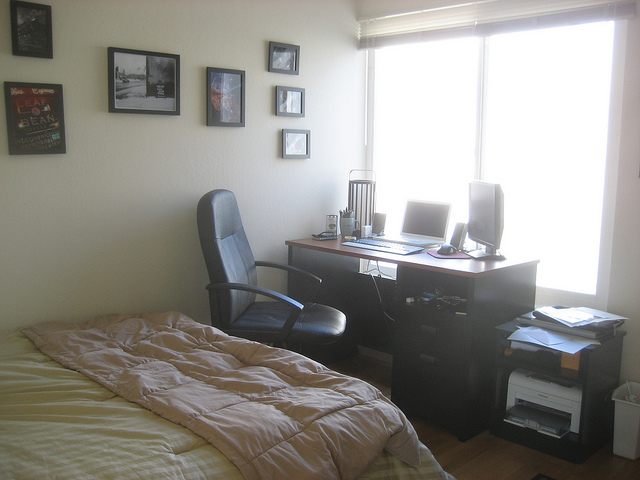

Question:	 Is the bed white?
Answer:	 [{'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 3}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 7}, {'answer': 'yes', 'answer_confidence': 'maybe', 'answer_id': 8}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 10}]
Labels:	 [3, 9]
Scores:	 [1.0, 1.0]
Scores for these labels:	 ['yes', 'no']
Predicted answers: ['white', 'blue']


In [54]:
id=30
showImage(False,id)
example = vqa2_dataset_val[id]
example = {k: v.unsqueeze(0).to(device) for k,v in example.items()}

# Forward pass
with torch.no_grad():
    outputs = lightning_model(**example)
    logits = outputs["logits"]
    top2_values, top2_indices = logits.topk(2, dim=-1)
    predicted_classes = top2_indices.squeeze().tolist()
    print("Predicted answers:", [config.id2label[predicted_class] for predicted_class in predicted_classes])


<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x480 at 0x7FA1A4102BF0>


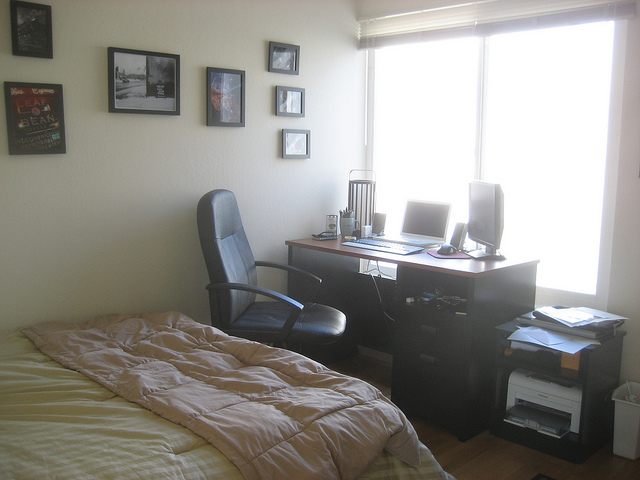

Question:	 What color are the walls?
Answer:	 [{'answer': 'white', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'off white', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'off white', 'answer_confidence': 'yes', 'answer_id': 3}, {'answer': 'white', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'white', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'beige', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'white', 'answer_confidence': 'maybe', 'answer_id': 7}, {'answer': 'white', 'answer_confidence': 'yes', 'answer_id': 8}, {'answer': 'white', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'white', 'answer_confidence': 'maybe', 'answer_id': 10}]
Labels:	 [4, 340]
Scores:	 [1.0, 0.3333333333333333]
Scores for these labels:	 ['white', 'beige']
Predicted answers: ['no', 'nothing']


In [55]:
id=41
showImage(False,id)
example = vqa2_dataset_val[id]
example = {k: v.unsqueeze(0).to(device) for k,v in example.items()}

# Forward pass
with torch.no_grad():
    outputs = lightning_model(**example)
    logits = outputs["logits"]
    top2_values, top2_indices = logits.topk(2, dim=-1)
    predicted_classes = top2_indices.squeeze().tolist()
    print("Predicted answers:", [config.id2label[predicted_class] for predicted_class in predicted_classes])

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x480 at 0x7FA1A40B34C0>


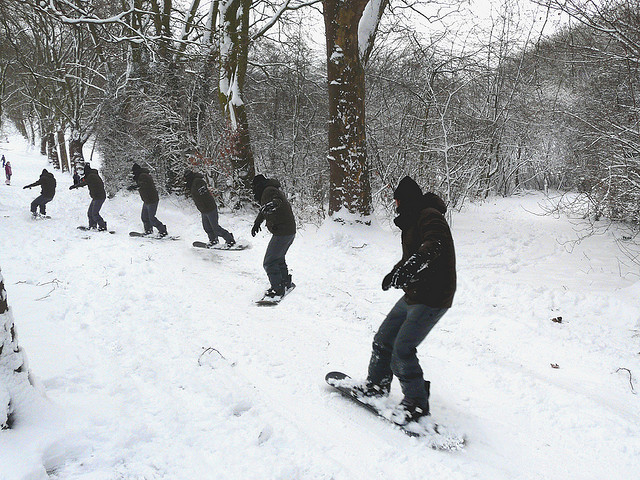

Question:	 Is it still snowing in the picture?
Answer:	 [{'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'yes', 'answer_confidence': 'maybe', 'answer_id': 3}, {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 7}, {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 8}, {'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'no', 'answer_confidence': 'maybe', 'answer_id': 10}]
Labels:	 [3, 9]
Scores:	 [1.0, 1.0]
Scores for these labels:	 ['yes', 'no']
Predicted answers: ['yes', 'no']


In [56]:
id=90
showImage(False,id)
example = vqa2_dataset_val[id]
example = {k: v.unsqueeze(0).to(device) for k,v in example.items()}

# Forward pass
with torch.no_grad():
    outputs = lightning_model(**example)
    logits = outputs["logits"]
    top2_values, top2_indices = logits.topk(2, dim=-1)
    predicted_classes = top2_indices.squeeze().tolist()
    print("Predicted answers:", [config.id2label[predicted_class] for predicted_class in predicted_classes])

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=427x640 at 0x7FA1A5F1E0E0>


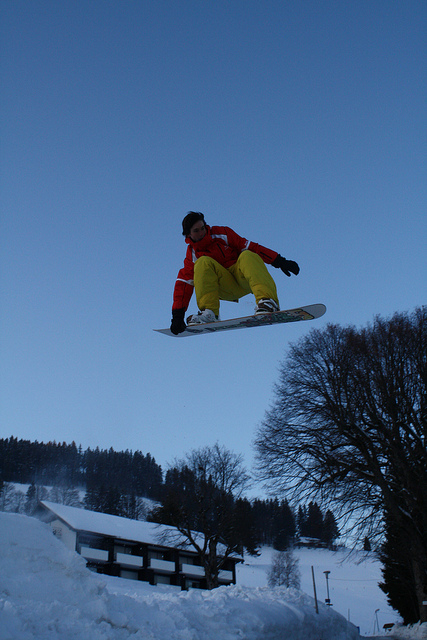

Question:	 What color is the man's jacket?
Answer:	 [{'answer': 'red', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'red', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'red', 'answer_confidence': 'yes', 'answer_id': 3}, {'answer': 'orange', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'red', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'red', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'red', 'answer_confidence': 'yes', 'answer_id': 7}, {'answer': 'red', 'answer_confidence': 'yes', 'answer_id': 8}, {'answer': 'red', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'red', 'answer_confidence': 'yes', 'answer_id': 10}]
Labels:	 [6, 2]
Scores:	 [1.0, 0.3333333333333333]
Scores for these labels:	 ['red', 'orange']
Predicted answers: ['no', 'nothing']


In [57]:
id=151
showImage(False,id)
example = vqa2_dataset_val[id]
example = {k: v.unsqueeze(0).to(device) for k,v in example.items()}

# Forward pass
with torch.no_grad():
    outputs = lightning_model(**example)
    logits = outputs["logits"]
    top2_values, top2_indices = logits.topk(2, dim=-1)
    predicted_classes = top2_indices.squeeze().tolist()
    print("Predicted answers:", [config.id2label[predicted_class] for predicted_class in predicted_classes])

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x425 at 0x7FA1A4103190>


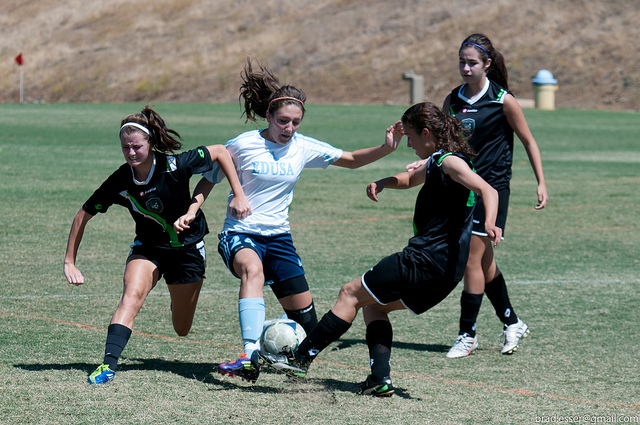

Question:	 What are on the girls heads?
Answer:	 [{'answer': 'headbands', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'headbands', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'hair combs', 'answer_confidence': 'yes', 'answer_id': 3}, {'answer': 'headbands', 'answer_confidence': 'maybe', 'answer_id': 4}, {'answer': 'headbands', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'hair band', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'headbands', 'answer_confidence': 'yes', 'answer_id': 7}, {'answer': 'headbands', 'answer_confidence': 'yes', 'answer_id': 8}, {'answer': 'headbands', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'headbands', 'answer_confidence': 'yes', 'answer_id': 10}]
Labels:	 []
Scores:	 []
Scores for these labels:	 []
Predicted answers: ['yes', 'no']


In [58]:
id=182
showImage(False,id)
example = vqa2_dataset_val[id]
example = {k: v.unsqueeze(0).to(device) for k,v in example.items()}

# Forward pass
with torch.no_grad():
    outputs = lightning_model(**example)
    logits = outputs["logits"]
    top2_values, top2_indices = logits.topk(2, dim=-1)
    predicted_classes = top2_indices.squeeze().tolist()
    print("Predicted answers:", [config.id2label[predicted_class] for predicted_class in predicted_classes])

In [59]:
# Test the model
test_dataloader = DataLoader(vqa2_dataset_test, collate_fn=collate_fn, batch_size=16, shuffle=False,num_workers=4)
trainer.test(lightning_model, dataloaders=test_dataloader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│    test_accuracy_epoch    │    0.23666666666666666    │
│       test_f1_epoch       │    0.1725966070966071     │
│         test_loss         │     7.44305419921875      │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 7.44305419921875,
  'test_accuracy_epoch': 0.23666666666666666,
  'test_f1_epoch': 0.1725966070966071}]